In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df_train = pd.read_csv('train.csv')
df_train.head()

,ID,AGE,GENDER,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME,TYPE_OF_VEHICLE
0,816393,40-64,female,20-29y,university,middle class,0.638050,0.0,after 2015,0.0,0.0,37379,11000.0,0,0,0,0.0,Sports Car
1,251762,26-39,male,20-29y,high school,middle class,0.475741,1.0,before 2015,1.0,0.0,10238,9000.0,0,0,0,1.0,HatchBack
2,481952,40-64,male,20-29y,none,middle class,0.839817,1.0,before 2015,1.0,1.0,10238,12000.0,0,0,0,1.0,Sedan
3,3506,40-64,male,20-29y,high school,upper class,0.682527,1.0,before 2015,0.0,1.0,92099,6000.0,1,0,0,1.0,Sedan
4,498013,40-64,female,20-29y,none,working class,0.572184,1.0,after 2015,1.0,1.0,32122,15000.0,0,0,1,0.0,Sedan


In [3]:
cat_features = [col for col in df_train.columns if df_train[col].dtypes == 'object']
cat_df = df_train[cat_features]

In [4]:
cat_df.describe()

,AGE,GENDER,DRIVING_EXPERIENCE,EDUCATION,INCOME,VEHICLE_YEAR,TYPE_OF_VEHICLE
count,105000,105000,105000,105000,105000,105000,105000
unique,4,2,4,3,4,2,4
top,40-64,male,20-29y,high school,upper class,before 2015,Sports Car
freq,33716,65317,37493,46590,51271,57511,34592


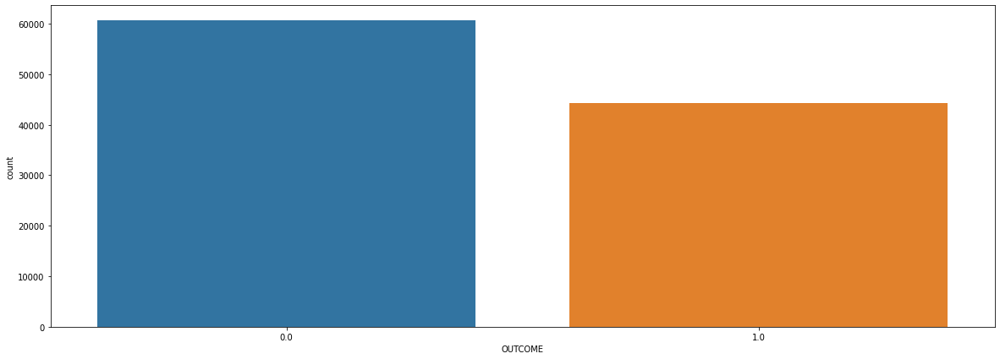

In [5]:
plt.figure(figsize=(20, 7))
sns.countplot(data=df_train, x='OUTCOME')
plt.show()

In [6]:
df_train['OUTCOME'].value_counts(normalize=True)

0.0    0.577352
1.0    0.422648
Name: OUTCOME, dtype: float64

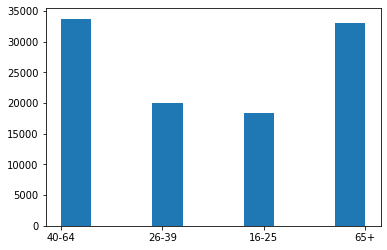

In [7]:
plt.hist(df_train['AGE'])
plt.show()

In [8]:
df_train['OUTCOME'].value_counts()

0.0    60622
1.0    44378
Name: OUTCOME, dtype: int64

In [9]:
df_train['GENDER'].value_counts()

male      65317
female    39683
Name: GENDER, dtype: int64

In [10]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [11]:
g_labels = ['Male', 'Female']
c_labels = ['No', 'Yes']
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=g_labels, values=df_train['GENDER'].value_counts(), name="Gender"),
              1, 1)
fig.add_trace(go.Pie(labels=c_labels, values=df_train['OUTCOME'].value_counts(), name="Churn"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Gender and Churn Distributions",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Gender', x=0.16, y=0.5, font_size=20, showarrow=False),
                 dict(text='Churn', x=0.84, y=0.5, font_size=20, showarrow=False)])
fig.show()

In [12]:
df_train["OUTCOME"][df_train["OUTCOME"]==0].groupby(by=df_train["GENDER"]).count()

GENDER
female    22617
male      38005
Name: OUTCOME, dtype: int64

In [13]:
22617+38005

60622

In [14]:
df_train["OUTCOME"][df_train["OUTCOME"]==1].groupby(by=df_train["GENDER"]).count()

GENDER
female    17066
male      27312
Name: OUTCOME, dtype: int64

In [15]:
17066+27312

44378

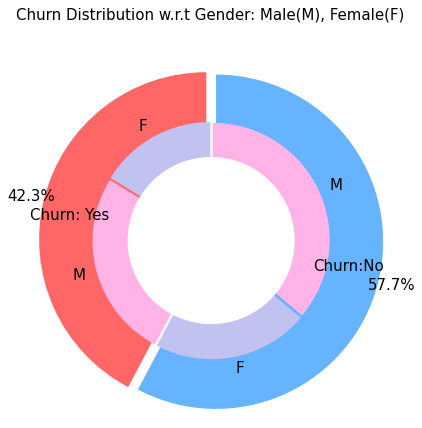

In [16]:
plt.figure(figsize=(6, 6))
labels =["Churn: Yes", "Churn:No"]
values = [44378, 60622]
labels_gender = ["F","M","F","M"]
sizes_gender = [17066,27312 , 22617,38005]
colors = ['#ff6666', '#66b3ff']
colors_gender = ['#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6']
explode = (0.3,0.3) 
explode_gender = (0.1,0.1,0.1,0.1)
textprops = {"fontsize":15}
#Plot
plt.pie(values, labels=labels,autopct='%1.1f%%',pctdistance=1.08, labeldistance=0.6,colors=colors, startangle=90,frame=True, explode=explode,radius=10, textprops =textprops, counterclock = True, )
plt.pie(sizes_gender,labels=labels_gender,colors=colors_gender,startangle=90, explode=explode_gender,radius=7, textprops =textprops, counterclock = True, )
#Draw circle
centre_circle = plt.Circle((0,0),5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Churn Distribution w.r.t Gender: Male(M), Female(F)', fontsize=15, y=1.1)

plt.axis('equal')
plt.tight_layout()
plt.show()

In [17]:
import plotly.express as px

In [18]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(df_train, x="OUTCOME", color="CHILDREN", barmode="group", title="<b>Dependents distribution</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [19]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(df_train, x="OUTCOME", color="MARRIED", barmode="group", title="<b>Dependents distribution</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [20]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(df_train, x="OUTCOME", color="AGE", barmode="group", title="<b>Outcome distribution</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [21]:
df_train['is_YOUNG'] = df_train['AGE'].apply(lambda x: 1 if x in '16-25' else 0)
df_train['is_SENIOR_CITIZEN'] = df_train['AGE'].apply(lambda x: 1 if x in '65+' else 0)

In [22]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(df_train, x="OUTCOME", color="is_YOUNG", barmode="group", title="<b>Outcome distribution</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [23]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(df_train, x="OUTCOME", color="is_SENIOR_CITIZEN", barmode="group", title="<b>Outcome distribution</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

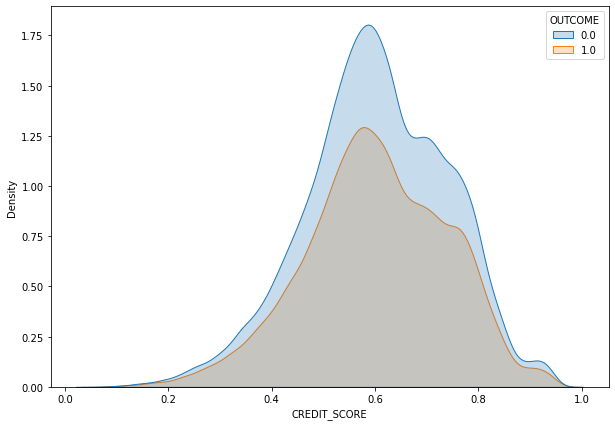

In [24]:
plt.figure(figsize=(10, 7))
sns.kdeplot(df_train['CREDIT_SCORE'], fill=True, hue=df_train['OUTCOME'])
plt.show()

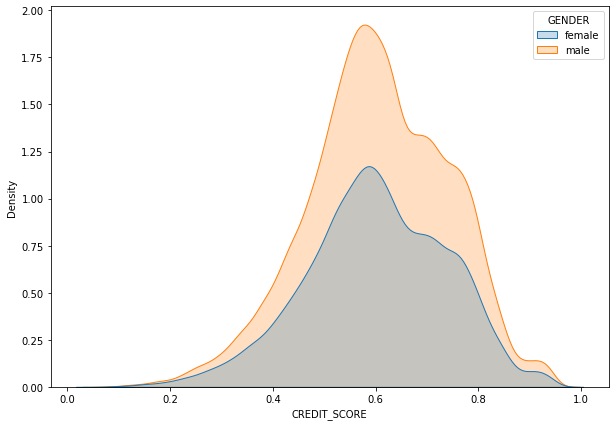

In [25]:
plt.figure(figsize=(10, 7))
sns.kdeplot(df_train['CREDIT_SCORE'], fill=True, hue=df_train['GENDER'])
plt.show()

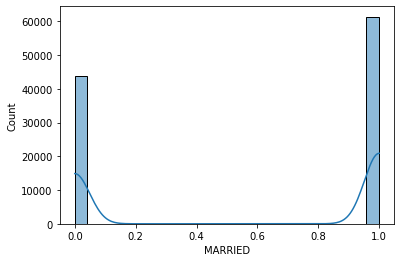

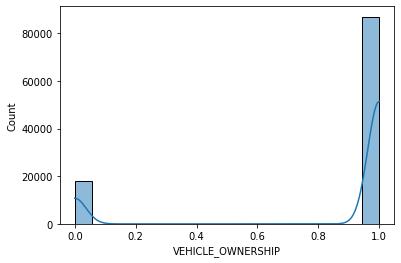

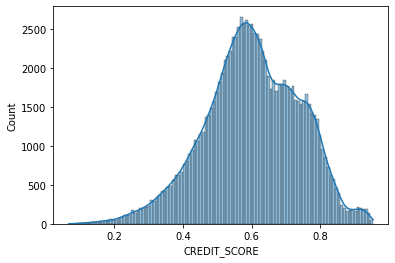

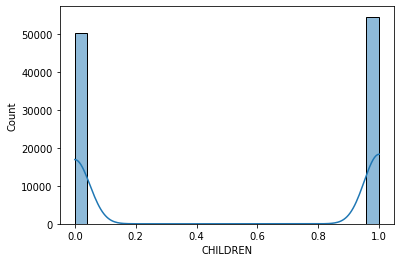

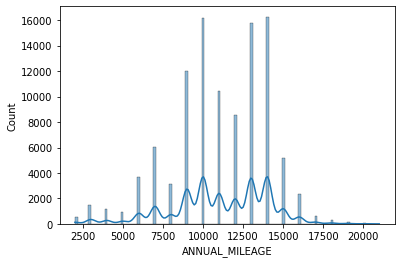

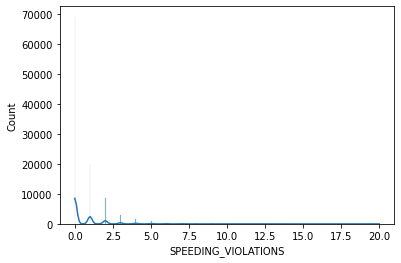

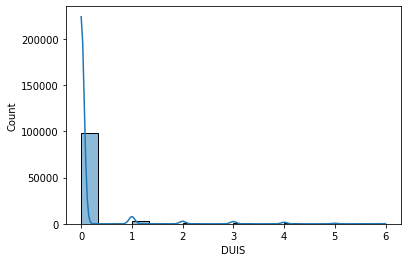

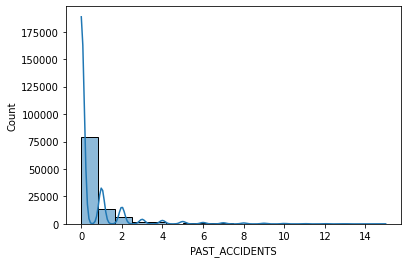

In [26]:
columns = ['MARRIED', 'VEHICLE_OWNERSHIP', 'CREDIT_SCORE', 'CHILDREN', 'ANNUAL_MILEAGE', 'SPEEDING_VIOLATIONS', 'DUIS', 'PAST_ACCIDENTS']
for i in columns:
    plt.figure()
    sns.histplot(df_train[i], kde=True)

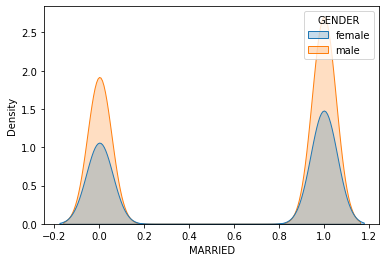

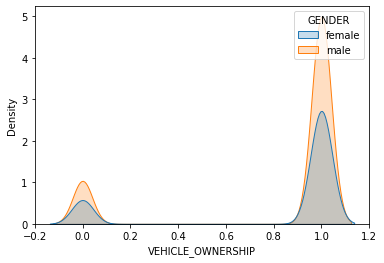

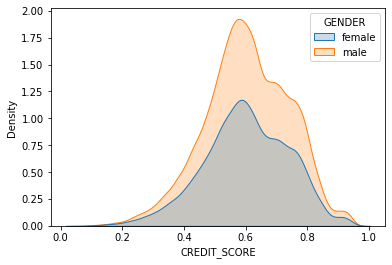

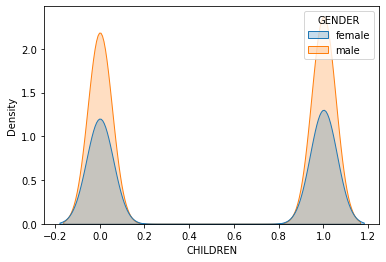

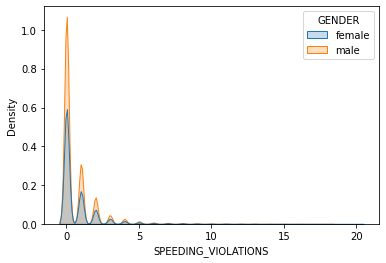

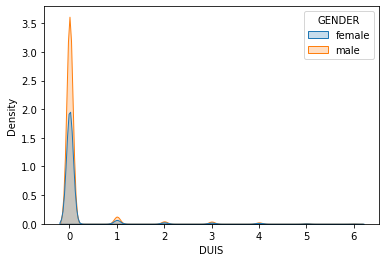

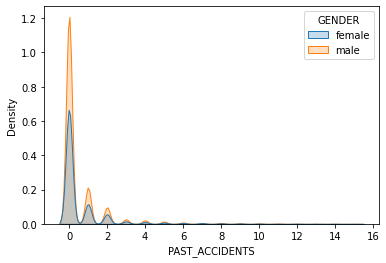

In [27]:
columns = ['MARRIED', 'VEHICLE_OWNERSHIP', 'CREDIT_SCORE', 'CHILDREN', 'SPEEDING_VIOLATIONS', 'DUIS', 'PAST_ACCIDENTS']
for i in columns:
    plt.figure()
    sns.kdeplot(df_train[i], shade=True, hue=df_train['GENDER'])

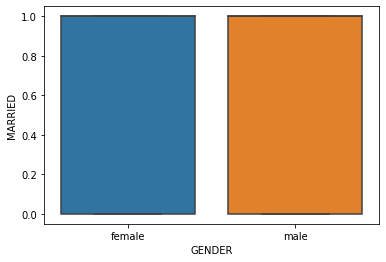

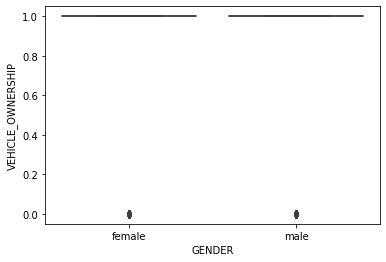

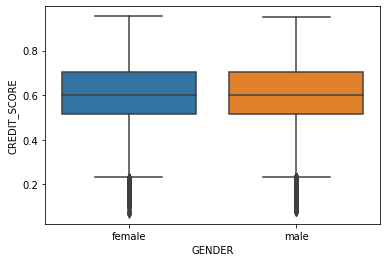

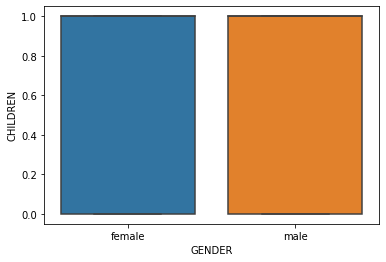

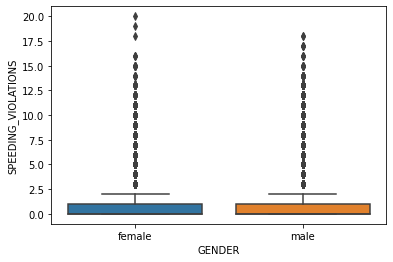

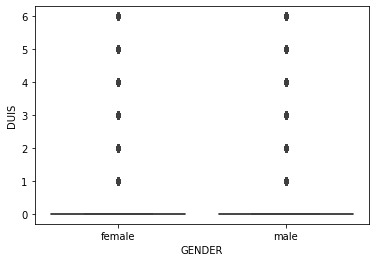

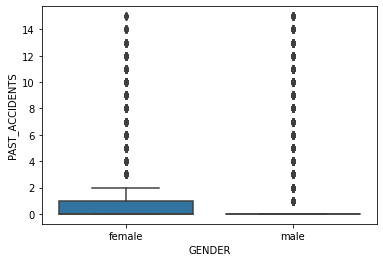

In [28]:
columns = ['MARRIED', 'VEHICLE_OWNERSHIP', 'CREDIT_SCORE', 'CHILDREN', 'SPEEDING_VIOLATIONS', 'DUIS', 'PAST_ACCIDENTS']
for i in columns:
    plt.figure()
    sns.boxplot(data=df_train, x='GENDER', y=df_train[i])

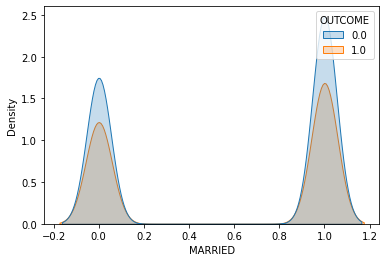

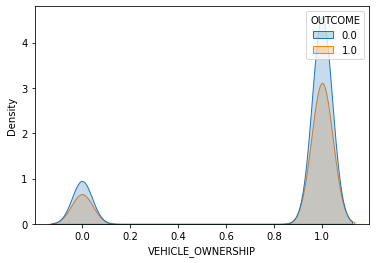

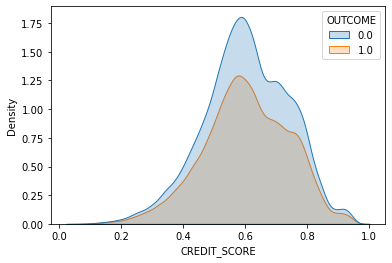

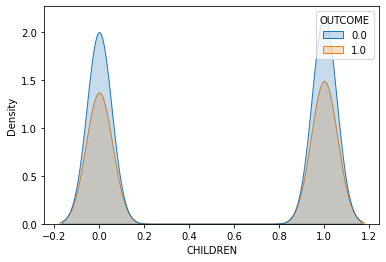

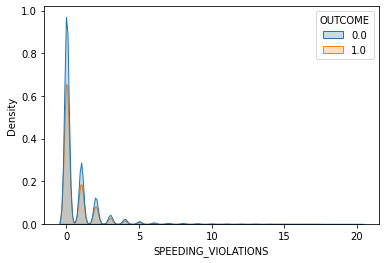

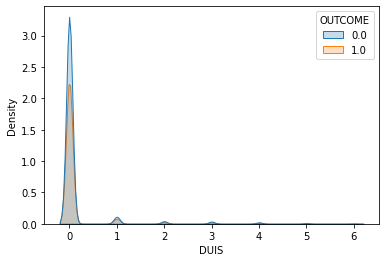

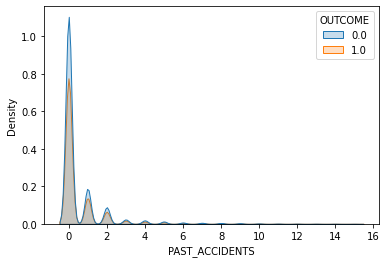

In [29]:
columns = ['MARRIED', 'VEHICLE_OWNERSHIP', 'CREDIT_SCORE', 'CHILDREN', 'SPEEDING_VIOLATIONS', 'DUIS', 'PAST_ACCIDENTS']
for i in columns:
    plt.figure()
    sns.kdeplot(df_train[i], shade=True, hue=df_train['OUTCOME'])

In [30]:
df_train.groupby('GENDER')[['MARRIED', 'CHILDREN']].value_counts(normalize=True)

GENDER  MARRIED  CHILDREN
female  1.0      1.0         0.302044
                 0.0         0.280473
        0.0      1.0         0.217952
                 0.0         0.199531
male    1.0      1.0         0.303887
                 0.0         0.281244
        0.0      1.0         0.216115
                 0.0         0.198754
dtype: float64

<AxesSubplot:xlabel='INCOME', ylabel='count'>

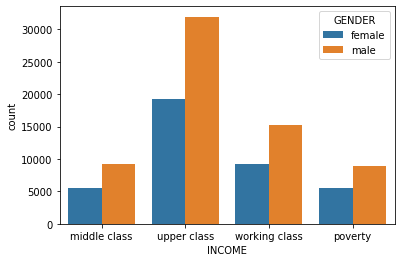

In [31]:
sns.countplot(x=df_train['INCOME'], hue=df_train['GENDER'])

<AxesSubplot:xlabel='EDUCATION', ylabel='Count'>

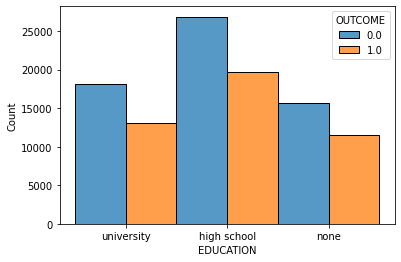

In [32]:
sns.histplot(data=df_train, x='EDUCATION', hue='OUTCOME', multiple='dodge')

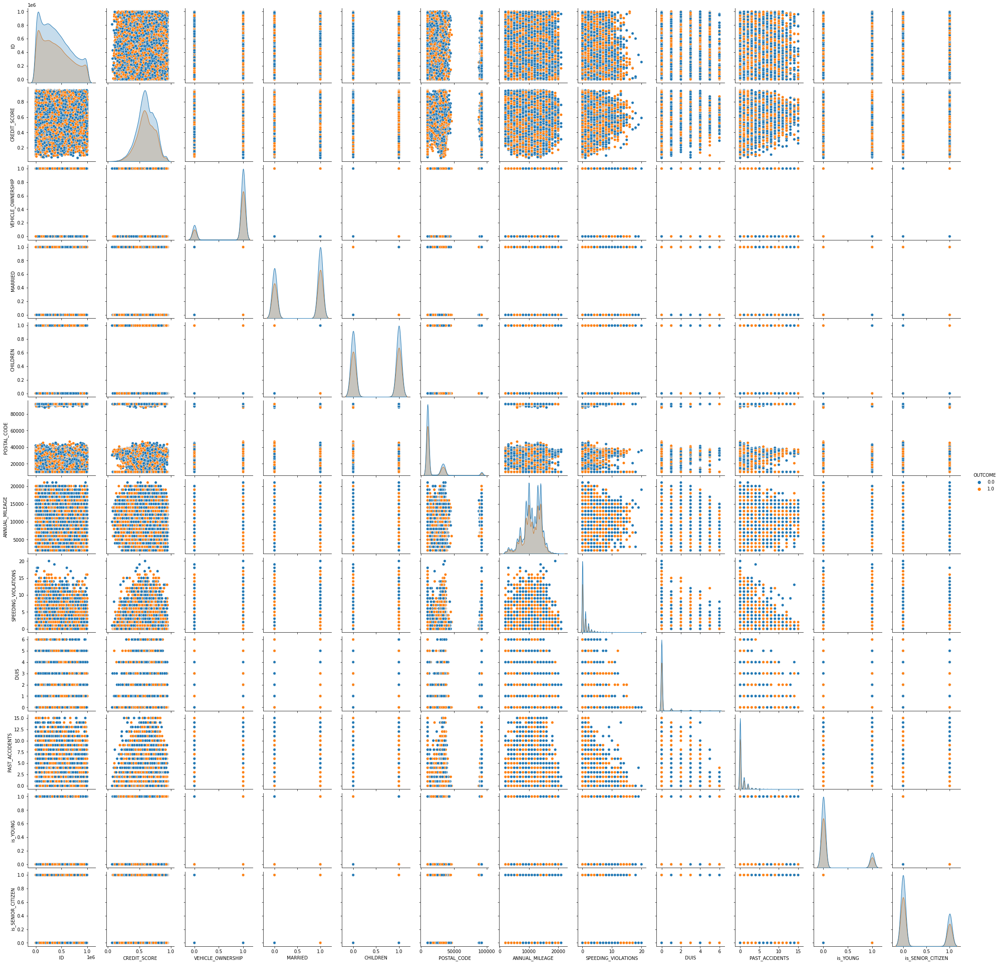

In [33]:
sns.pairplot(df_train, hue='OUTCOME')

In [34]:
df_train['TYPE_OF_VEHICLE'].value_counts(normalize=True)

Sports Car    0.329448
Sedan         0.267810
HatchBack     0.237143
SUV           0.165600
Name: TYPE_OF_VEHICLE, dtype: float64

In [35]:
df_train.groupby('TYPE_OF_VEHICLE')['OUTCOME'].value_counts(normalize=True)

TYPE_OF_VEHICLE  OUTCOME
HatchBack        0.0        0.574297
                 1.0        0.425703
SUV              0.0        0.584886
                 1.0        0.415114
Sedan            0.0        0.582041
                 1.0        0.417959
Sports Car       0.0        0.571953
                 1.0        0.428047
Name: OUTCOME, dtype: float64

In [36]:
df_train.corr()['OUTCOME']

ID                    -0.002383
CREDIT_SCORE          -0.003068
VEHICLE_OWNERSHIP     -0.003074
MARRIED               -0.006028
CHILDREN               0.001869
POSTAL_CODE           -0.002801
ANNUAL_MILEAGE        -0.001104
SPEEDING_VIOLATIONS    0.000151
DUIS                   0.000382
PAST_ACCIDENTS        -0.002343
OUTCOME                1.000000
is_YOUNG              -0.004022
is_SENIOR_CITIZEN     -0.000553
Name: OUTCOME, dtype: float64

In [37]:
df_train[df_train['PAST_ACCIDENTS']==0].groupby('PAST_ACCIDENTS')['OUTCOME'].value_counts()

PAST_ACCIDENTS  OUTCOME
0               0.0        45645
                1.0        33208
Name: OUTCOME, dtype: int64

In [38]:
45645+33208 

78853

In [39]:
78853/33208

2.37451818838834

In [40]:
78853/45645

1.7275276591083362

In [41]:
df_train[df_train['PAST_ACCIDENTS']>0].groupby('PAST_ACCIDENTS')['OUTCOME'].value_counts()

PAST_ACCIDENTS  OUTCOME
1               0.0        7823
                1.0        5939
2               0.0        3680
                1.0        2774
3               0.0         988
                1.0         761
4               0.0         786
                1.0         531
5               0.0         538
                1.0         368
6               0.0         311
                1.0         223
7               0.0         247
                1.0         166
8               0.0         202
                1.0         138
9               0.0         144
                1.0          92
10              0.0          90
                1.0          67
11              0.0          56
                1.0          36
12              0.0          42
                1.0          33
13              0.0          32
                1.0          18
14              0.0          23
                1.0          15
15              0.0          15
                1.0           9
Name: OUTCOME, d

In [42]:
for i in df_train['PAST_ACCIDENTS'].unique():
    count = df_train[df_train['PAST_ACCIDENTS']==i].groupby('PAST_ACCIDENTS')['OUTCOME'].value_counts()
    (val1, val2) = count.values[0], count.values[1]
    total = val1+val2
    ratio = np.round((val1/total), 4), np.round((val2/total), 4)
    print(f'Ratio of outcome of people with past accidents {i} is {ratio[0]}:{ratio[1]}')

Ratio of outcome of people with past accidents 0 is 0.5789:0.4211
Ratio of outcome of people with past accidents 1 is 0.5684:0.4316
Ratio of outcome of people with past accidents 2 is 0.5702:0.4298
Ratio of outcome of people with past accidents 4 is 0.5968:0.4032
Ratio of outcome of people with past accidents 5 is 0.5938:0.4062
Ratio of outcome of people with past accidents 7 is 0.5981:0.4019
Ratio of outcome of people with past accidents 6 is 0.5824:0.4176
Ratio of outcome of people with past accidents 9 is 0.6102:0.3898
Ratio of outcome of people with past accidents 3 is 0.5649:0.4351
Ratio of outcome of people with past accidents 8 is 0.5941:0.4059
Ratio of outcome of people with past accidents 13 is 0.64:0.36
Ratio of outcome of people with past accidents 10 is 0.5732:0.4268
Ratio of outcome of people with past accidents 12 is 0.56:0.44
Ratio of outcome of people with past accidents 15 is 0.625:0.375
Ratio of outcome of people with past accidents 11 is 0.6087:0.3913
Ratio of outcom

In [43]:
for i in df_train['DUIS'].unique():
    count = df_train[df_train['DUIS']==i].groupby('DUIS')['OUTCOME'].value_counts()
    (val1, val2) = count.values[0], count.values[1]
    total = val1+val2
    ratio = np.round((val1/total), 4), np.round((val2/total), 4)
    print(f'Ratio of outcome of people with duis {i} is {ratio[0]}:{ratio[1]}')

Ratio of outcome of people with duis 0 is 0.5776:0.4224
Ratio of outcome of people with duis 3 is 0.5725:0.4275
Ratio of outcome of people with duis 1 is 0.5679:0.4321
Ratio of outcome of people with duis 2 is 0.5882:0.4118
Ratio of outcome of people with duis 4 is 0.574:0.426
Ratio of outcome of people with duis 5 is 0.5777:0.4223
Ratio of outcome of people with duis 6 is 0.6184:0.3816


In [44]:
count = df_train.groupby('SPEEDING_VIOLATIONS')['OUTCOME'].value_counts()
count

SPEEDING_VIOLATIONS  OUTCOME
0                    0.0        39813
                     1.0        29350
1                    0.0        11566
                     1.0         8301
2                    0.0         5081
                     1.0         3668
3                    0.0         1728
                     1.0         1262
4                    0.0          990
                     1.0          698
5                    0.0          526
                     1.0          385
6                    0.0          289
                     1.0          194
7                    0.0          177
                     1.0          174
8                    0.0          153
                     1.0          107
9                    0.0           99
                     1.0           73
10                   0.0           59
                     1.0           50
11                   0.0           49
                     1.0           38
12                   0.0           32
                     

In [45]:
len(count) == 2

False

In [46]:
for i in df_train['SPEEDING_VIOLATIONS'].unique():
    count = df_train[df_train['SPEEDING_VIOLATIONS']==i].groupby('SPEEDING_VIOLATIONS')['OUTCOME'].value_counts()
    if len(count) == 2:
        (val1, val2) = count.values[0], count.values[1]
        total = val1+val2
        ratio = np.round((val1/total), 4), np.round((val2/total), 4)
        print(f'Ratio of outcome of people with speeding violations {i} is {ratio[0]}:{ratio[1]}')
    else:
        print('Length of GroupBy object is 1')

Ratio of outcome of people with speeding violations 0 is 0.5756:0.4244
Ratio of outcome of people with speeding violations 1 is 0.5822:0.4178
Ratio of outcome of people with speeding violations 4 is 0.5865:0.4135
Ratio of outcome of people with speeding violations 11 is 0.5632:0.4368
Ratio of outcome of people with speeding violations 3 is 0.5779:0.4221
Ratio of outcome of people with speeding violations 2 is 0.5808:0.4192
Ratio of outcome of people with speeding violations 6 is 0.5983:0.4017
Ratio of outcome of people with speeding violations 5 is 0.5774:0.4226
Ratio of outcome of people with speeding violations 13 is 0.5345:0.4655
Ratio of outcome of people with speeding violations 7 is 0.5043:0.4957
Ratio of outcome of people with speeding violations 10 is 0.5413:0.4587
Ratio of outcome of people with speeding violations 8 is 0.5885:0.4115
Ratio of outcome of people with speeding violations 12 is 0.5714:0.4286
Length of GroupBy object is 1
Ratio of outcome of people with speeding vi

The address of the owner can affect the premiums. Areas with high crime rates generally lead to higher costs of insurance.

<AxesSubplot:xlabel='POSTAL_CODE', ylabel='Density'>

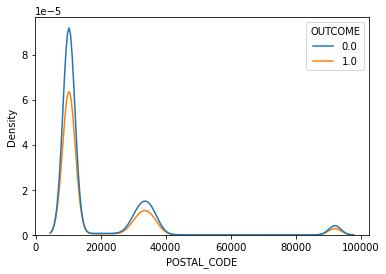

In [47]:
sns.kdeplot(data=df_train, x='POSTAL_CODE', hue='OUTCOME')

<AxesSubplot:xlabel='ANNUAL_MILEAGE', ylabel='Density'>

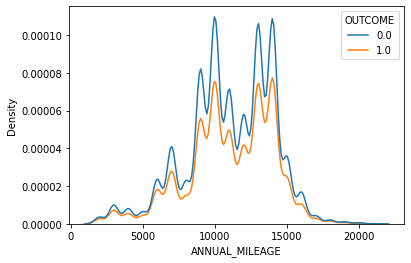

In [48]:
sns.kdeplot(data=df_train, x='ANNUAL_MILEAGE', hue='OUTCOME')

Teenage drivers who have no driving record will have higher car insurance premiums. However, young drivers are often offered discounts if they undertake further driver training on recognized courses, such as the Pass Plus scheme in the UK. In the US many insurers offer a good-grade discount to students with a good academic record and resident-student discounts to those who live away from home. Generally insurance premiums tend to become lower at the age of 25. Some insurance companies offer "stand alone" car insurance policies specifically for teenagers with lower premiums. By placing restrictions on teenagers' driving (forbidding driving after dark, or giving rides to other teens, for example), these companies effectively reduce their risk.

Senior drivers are often eligible for retirement discounts, reflecting the lower average miles driven by this age group. However, rates may increase for senior drivers after age 65, due to increased risk associated with much older drivers. Typically, the increased risk for drivers over 65 years of age is associated with slower reflexes, reaction times, and being more injury-prone.

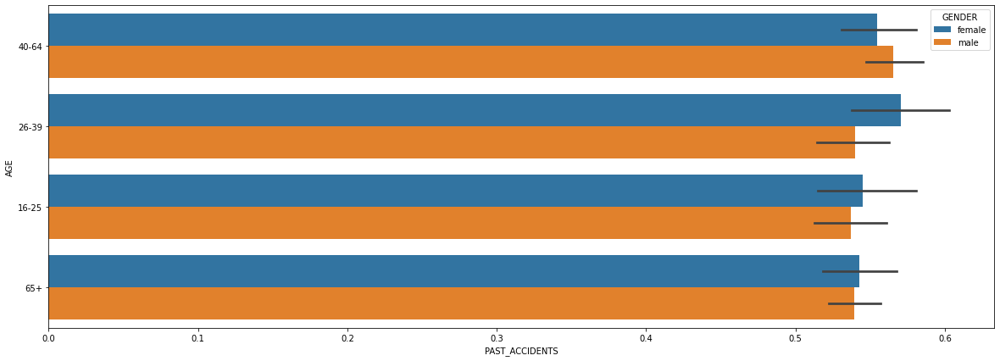

In [49]:
plt.figure(figsize=(20, 7))
sns.barplot(data=df_train, x='PAST_ACCIDENTS', y='AGE', hue='GENDER')
plt.show()

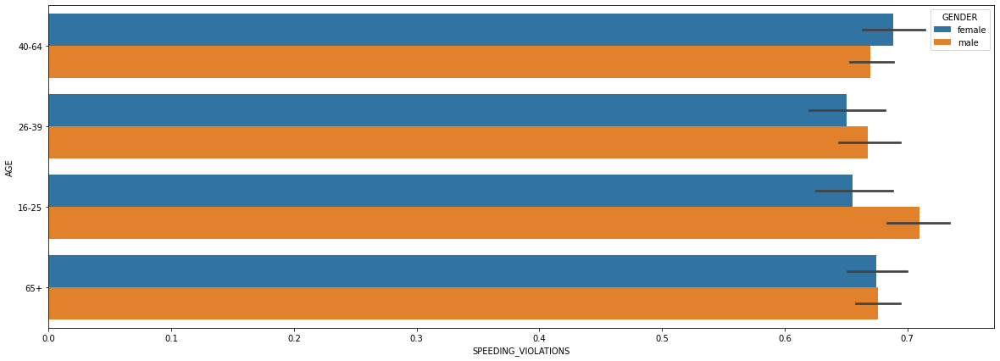

In [50]:
plt.figure(figsize=(20, 7))
sns.barplot(data=df_train, x='SPEEDING_VIOLATIONS', y='AGE', hue='GENDER')
plt.show()

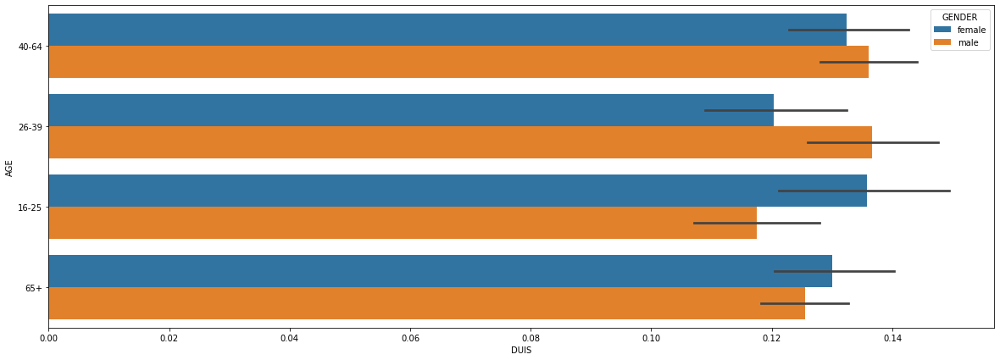

In [51]:
plt.figure(figsize=(20, 7))
sns.barplot(data=df_train, x='DUIS', y='AGE', hue='GENDER')
plt.show()

In [52]:
df_train.groupby('SPEEDING_VIOLATIONS')['OUTCOME'].value_counts()

SPEEDING_VIOLATIONS  OUTCOME
0                    0.0        39813
                     1.0        29350
1                    0.0        11566
                     1.0         8301
2                    0.0         5081
                     1.0         3668
3                    0.0         1728
                     1.0         1262
4                    0.0          990
                     1.0          698
5                    0.0          526
                     1.0          385
6                    0.0          289
                     1.0          194
7                    0.0          177
                     1.0          174
8                    0.0          153
                     1.0          107
9                    0.0           99
                     1.0           73
10                   0.0           59
                     1.0           50
11                   0.0           49
                     1.0           38
12                   0.0           32
                     

In [53]:
df_train.groupby('PAST_ACCIDENTS')['OUTCOME'].value_counts()

PAST_ACCIDENTS  OUTCOME
0               0.0        45645
                1.0        33208
1               0.0         7823
                1.0         5939
2               0.0         3680
                1.0         2774
3               0.0          988
                1.0          761
4               0.0          786
                1.0          531
5               0.0          538
                1.0          368
6               0.0          311
                1.0          223
7               0.0          247
                1.0          166
8               0.0          202
                1.0          138
9               0.0          144
                1.0           92
10              0.0           90
                1.0           67
11              0.0           56
                1.0           36
12              0.0           42
                1.0           33
13              0.0           32
                1.0           18
14              0.0           23
                1.0

In [54]:
df_train[['MARRIED', 'GENDER', 'AGE', 'CHILDREN', 'EDUCATION', 'INCOME']]

,MARRIED,GENDER,AGE,CHILDREN,EDUCATION,INCOME
0,0.0,female,40-64,0.0,university,middle class
1,1.0,male,26-39,0.0,high school,middle class
2,1.0,male,40-64,1.0,none,middle class
3,0.0,male,40-64,1.0,high school,upper class
4,1.0,female,40-64,1.0,none,working class
...,...,...,...,...,...,...
104995,0.0,female,65+,0.0,high school,upper class
104996,1.0,female,40-64,0.0,none,working class
104997,1.0,male,16-25,0.0,none,upper class
104998,0.0,female,40-64,0.0,high school,working class


Marital status

Statistics show that married drivers average fewer crashes than the rest of the population so policy owners who are married often receive lower premiums than single persons.

<AxesSubplot:xlabel='MARRIED', ylabel='count'>

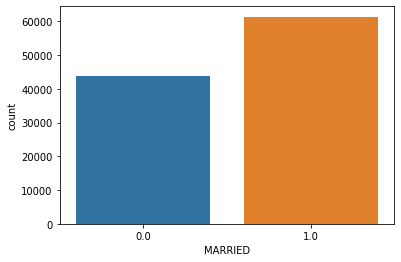

In [55]:
sns.countplot(data=df_train, x='MARRIED')

<AxesSubplot:xlabel='AGE', ylabel='Count'>

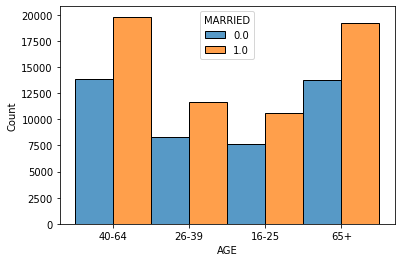

In [56]:
sns.histplot(data=df_train, x='AGE', hue='MARRIED', multiple='dodge')

In [57]:
df_train.groupby('MARRIED')['PAST_ACCIDENTS'].value_counts()

MARRIED  PAST_ACCIDENTS
0.0      0                 32863
         1                  5663
         2                  2706
         3                   740
         4                   534
         5                   394
         6                   216
         7                   162
         8                   134
         9                    90
         10                   60
         12                   30
         11                   29
         13                   17
         14                   14
         15                   13
1.0      0                 45990
         1                  8099
         2                  3748
         3                  1009
         4                   783
         5                   512
         6                   318
         7                   251
         8                   206
         9                   146
         10                   97
         11                   63
         12                   45
         13        

In [58]:
df_train.head()

,ID,AGE,GENDER,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME,TYPE_OF_VEHICLE,is_YOUNG,is_SENIOR_CITIZEN
0,816393,40-64,female,20-29y,university,middle class,0.638050,0.0,after 2015,0.0,0.0,37379,11000.0,0,0,0,0.0,Sports Car,0,0
1,251762,26-39,male,20-29y,high school,middle class,0.475741,1.0,before 2015,1.0,0.0,10238,9000.0,0,0,0,1.0,HatchBack,0,0
2,481952,40-64,male,20-29y,none,middle class,0.839817,1.0,before 2015,1.0,1.0,10238,12000.0,0,0,0,1.0,Sedan,0,0
3,3506,40-64,male,20-29y,high school,upper class,0.682527,1.0,before 2015,0.0,1.0,92099,6000.0,1,0,0,1.0,Sedan,0,0
4,498013,40-64,female,20-29y,none,working class,0.572184,1.0,after 2015,1.0,1.0,32122,15000.0,0,0,1,0.0,Sedan,0,0


In [59]:
df_train['DUIS'].value_counts()

0    98246
1     3430
2     1219
3     1069
4      709
5      251
6       76
Name: DUIS, dtype: int64

In [60]:
df_train.groupby('DUIS')['OUTCOME'].value_counts(normalize=True)

DUIS  OUTCOME
0     0.0        0.577591
      1.0        0.422409
1     0.0        0.567930
      1.0        0.432070
2     0.0        0.588187
      1.0        0.411813
3     0.0        0.572498
      1.0        0.427502
4     0.0        0.574048
      1.0        0.425952
5     0.0        0.577689
      1.0        0.422311
6     0.0        0.618421
      1.0        0.381579
Name: OUTCOME, dtype: float64

<AxesSubplot:xlabel='DUIS,PAST_ACCIDENTS,OUTCOME'>

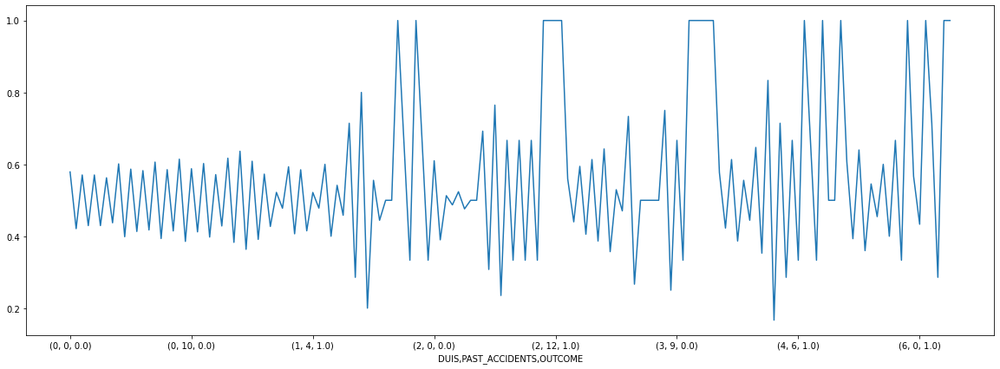

In [61]:
df_train.groupby(['DUIS', 'PAST_ACCIDENTS'])['OUTCOME'].value_counts(normalize=True).plot(figsize=(20, 7))

<AxesSubplot:xlabel='DUIS,SPEEDING_VIOLATIONS,OUTCOME'>

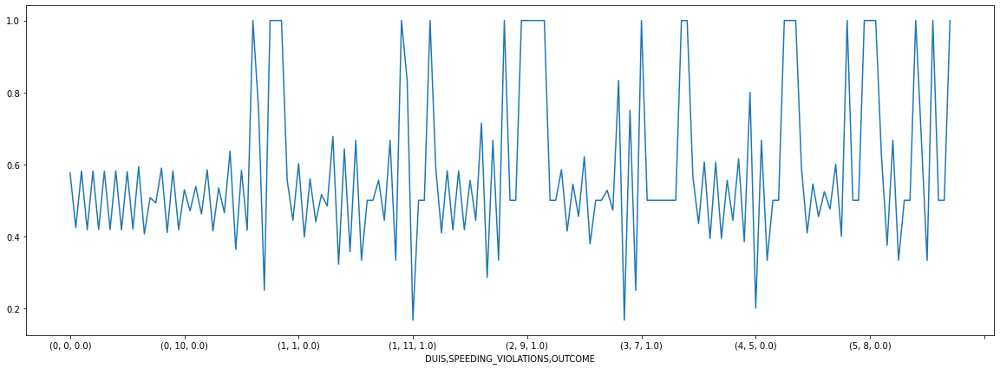

In [62]:
df_train.groupby(['DUIS', 'SPEEDING_VIOLATIONS'])['OUTCOME'].value_counts(normalize=True).plot(figsize=(20, 7))

In [63]:
df_train.groupby('PAST_ACCIDENTS')['OUTCOME'].mean().sort_values(ascending=False)

PAST_ACCIDENTS
12    0.440000
3     0.435106
1     0.431551
2     0.429811
10    0.426752
0     0.421138
6     0.417603
5     0.406181
8     0.405882
4     0.403189
7     0.401937
14    0.394737
11    0.391304
9     0.389831
15    0.375000
13    0.360000
Name: OUTCOME, dtype: float64

In [64]:
df_train.groupby('PAST_ACCIDENTS')['OUTCOME'].value_counts(normalize=True)

PAST_ACCIDENTS  OUTCOME
0               0.0        0.578862
                1.0        0.421138
1               0.0        0.568449
                1.0        0.431551
2               0.0        0.570189
                1.0        0.429811
3               0.0        0.564894
                1.0        0.435106
4               0.0        0.596811
                1.0        0.403189
5               0.0        0.593819
                1.0        0.406181
6               0.0        0.582397
                1.0        0.417603
7               0.0        0.598063
                1.0        0.401937
8               0.0        0.594118
                1.0        0.405882
9               0.0        0.610169
                1.0        0.389831
10              0.0        0.573248
                1.0        0.426752
11              0.0        0.608696
                1.0        0.391304
12              0.0        0.560000
                1.0        0.440000
13              0.0        0.640000
    

In [65]:
df_train['VEHICAL_DAMAGE'] = df_train['PAST_ACCIDENTS'].apply(lambda x: 'Damaged' if x > 0 else 'Not Damaged')

In [66]:
df_train['VEHICAL_DAMAGE'].value_counts()

Not Damaged    78853
Damaged        26147
Name: VEHICAL_DAMAGE, dtype: int64

In [67]:
df_train['PAST_ACCIDENTS'].value_counts()

0     78853
1     13762
2      6454
3      1749
4      1317
5       906
6       534
7       413
8       340
9       236
10      157
11       92
12       75
13       50
14       38
15       24
Name: PAST_ACCIDENTS, dtype: int64

In [68]:
df_train.groupby('VEHICAL_DAMAGE')['OUTCOME'].value_counts(normalize=True)

VEHICAL_DAMAGE  OUTCOME
Damaged         0.0        0.572800
                1.0        0.427200
Not Damaged     0.0        0.578862
                1.0        0.421138
Name: OUTCOME, dtype: float64

In [69]:
df_train.groupby('VEHICAL_DAMAGE')['OUTCOME'].mean()

VEHICAL_DAMAGE
Damaged        0.427200
Not Damaged    0.421138
Name: OUTCOME, dtype: float64

In [70]:
pd.set_option('display.max_columns', 25)
df_train.head()

,ID,AGE,GENDER,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME,TYPE_OF_VEHICLE,is_YOUNG,is_SENIOR_CITIZEN,VEHICAL_DAMAGE
0,816393,40-64,female,20-29y,university,middle class,0.638050,0.0,after 2015,0.0,0.0,37379,11000.0,0,0,0,0.0,Sports Car,0,0,Not Damaged
1,251762,26-39,male,20-29y,high school,middle class,0.475741,1.0,before 2015,1.0,0.0,10238,9000.0,0,0,0,1.0,HatchBack,0,0,Not Damaged
2,481952,40-64,male,20-29y,none,middle class,0.839817,1.0,before 2015,1.0,1.0,10238,12000.0,0,0,0,1.0,Sedan,0,0,Not Damaged
3,3506,40-64,male,20-29y,high school,upper class,0.682527,1.0,before 2015,0.0,1.0,92099,6000.0,1,0,0,1.0,Sedan,0,0,Not Damaged
4,498013,40-64,female,20-29y,none,working class,0.572184,1.0,after 2015,1.0,1.0,32122,15000.0,0,0,1,0.0,Sedan,0,0,Damaged


<AxesSubplot:>

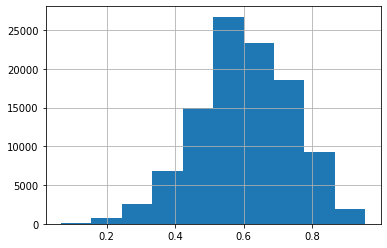

In [71]:
df_train['CREDIT_SCORE'].hist()

In [72]:
df_train['POSTAL_CODE'].describe()

count    105000.000000
mean      18045.439267
std       16709.040449
min       10238.000000
25%       10238.000000
50%       10238.000000
75%       22957.750000
max       92101.000000
Name: POSTAL_CODE, dtype: float64

In [73]:
df_train.head()

,ID,AGE,GENDER,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME,TYPE_OF_VEHICLE,is_YOUNG,is_SENIOR_CITIZEN,VEHICAL_DAMAGE
0,816393,40-64,female,20-29y,university,middle class,0.638050,0.0,after 2015,0.0,0.0,37379,11000.0,0,0,0,0.0,Sports Car,0,0,Not Damaged
1,251762,26-39,male,20-29y,high school,middle class,0.475741,1.0,before 2015,1.0,0.0,10238,9000.0,0,0,0,1.0,HatchBack,0,0,Not Damaged
2,481952,40-64,male,20-29y,none,middle class,0.839817,1.0,before 2015,1.0,1.0,10238,12000.0,0,0,0,1.0,Sedan,0,0,Not Damaged
3,3506,40-64,male,20-29y,high school,upper class,0.682527,1.0,before 2015,0.0,1.0,92099,6000.0,1,0,0,1.0,Sedan,0,0,Not Damaged
4,498013,40-64,female,20-29y,none,working class,0.572184,1.0,after 2015,1.0,1.0,32122,15000.0,0,0,1,0.0,Sedan,0,0,Damaged


In [74]:
df_train['POSTAL_CODE'].dtypes

dtype('int64')

In [75]:
df_train['POSTAL_CODE'] = df_train['POSTAL_CODE'].astype('int64')

In [76]:
df_train['POSTAL_CODE_BINNED'] = pd.cut(df_train['POSTAL_CODE'], bins=9)

In [77]:
df_train['TYPE_OF_VEHICLE'].unique()

array(['Sports Car', 'HatchBack', 'Sedan', 'SUV'], dtype=object)

In [78]:
df_train['CREDIT_SCORE_BINNED'].dtypes

KeyError: 'CREDIT_SCORE_BINNED'

In [ ]:
df_train['POSTAL_CODE_BINNED'].dtypes

In [ ]:
df_train['CREDIT_SCORE_BINNED'] = df_train['CREDIT_SCORE_BINNED'].astype('object')
df_train['POSTAL_CODE_BINNED'] = df_train['POSTAL_CODE_BINNED'].astype('object')

In [79]:
df_train['HP'] = df_train['TYPE_OF_VEHICLE'].apply(lambda x: 1 if x == 'Sports Car' else 2 if x == 'SUV' else 3 if x == 'Sedan' else 4)

In [80]:
df_train['VW'] = df_train['TYPE_OF_VEHICLE'].apply(lambda x: 1 if x == 'SUV' else 2 if x == 'Sedan' else 3 if x == 'Sports Car' else 4)

In [ ]:
#df_train.to_csv('train_updated.csv', index=False)